# Reveal multiple level of biological heterogeneities in Mouse Hypothalamus by MERFISH-seq

In this tutorial, we will showcae the STEP for revealing multiple levels of biological heterogeneities in the Mouse Hypothalamus by MERFISH-seq. STEP has been designed to shed light on different aspects of cellular complexity:
1. **Cell State Level Heterogeneity**: STEP can capture unique cellular states based on genetic expressions in the mouse hypothalamus.
2. **Spatial Domain Level Heterogeneity**: STEP facilitates understanding of spatial patterns and relationships among cells by smoothing the cell state embeddings.
3. **End-to-End (e2e) Mode for Direct Spatial Domain Identification**: A streamlined process to directly identify and analyze spatial heterogeneity.

The aim of this tutorial is to guide users through the process of utilizing and understanding the capabilities of STEP, enabling users to dive deep into the biological intricacies of the mouse hypothalamus.

In [1]:
import os
import anndata as ad
import scanpy as sc
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

from step import scModel, stModel
sc.settings.figdir = './results/MERFISH'
sc.set_figure_params(dpi_save=300, figsize=(6, 4.5))

st_file = './data/merfish_animal1.h5ad'

/projects/82505004-e7a0-445f-ab3c-80d03c91438f/.cache/pypoetry/virtualenvs/step-Ajq_Bw_i-py3.10/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Cell state level heterogeneity

For the identification of cell state level hetorogeneity single-cell resolution data, we use `step.scModel` which will focus on the modeling of transcipts and elimination of the potential batch-effects (not presented in this data), ignoring the spatial context even though the data is spatially resovled.

### Setup STEP object

Due to the limitation of the MERFISH technique, there're only 161 genes across sections. Subsequently, we will use all these genes by setting the paramter `n_top_genes=None` and set the parameter `n_modules=20` to model the fewer gene modules.

In [2]:
stepc = scModel(
    file_path=st_file,
    n_top_genes=None,
    layer_key=None,
    batch_key='Bregma',
    class_key='Cell_class',
    module_dim=30,
    hidden_dim=64,
    n_modules=20,
    decoder_type='zinb',
    n_dec_hid_layers=1,
)

Using all genes
Using given geneset
Adding count data to layer 'counts'
================Dataset Info================
Batch key: Bregma 
Class key: Cell_class 
Number of Batches: 5 
Number of Classes: 15 
Gene Expr: (28316, 161)
Batch Label: (28316,)


In [3]:
stepc.adata.obs.head()

,Animal_ID,Animal_sex,Behavior,Bregma,Centroid_X,Centroid_Y,Cell_class,Neuron_cluster_ID,in_tissue,n_genes
Cell_ID,,,,,,,,,,
6c59b1ec-95df-4f25-882a-ac94d99b87d8,1,Female,Naive,-0.04,-3033.401378,2825.155877,Endothelial 3,NaN,True,29
aa7ce410-c485-42c9-9c29-bc1d90a46e00,1,Female,Naive,-0.04,-3027.328655,2955.936449,Inhibitory,I-5,True,61
8426329e-077b-4385-bd94-c9fdaeb89bd1,1,Female,Naive,-0.04,-3020.512953,2961.696710,Inhibitory,I-5,True,54
a7e4e0de-8baa-4136-8cac-fa9bc759e7e8,1,Female,Naive,-0.04,-3017.397490,2995.915801,Inhibitory,I-5,True,86
c55468d5-1b2c-4477-b4ad-3653f5bbda35,1,Female,Naive,-0.04,-3005.478613,2877.528929,Endothelial 1,NaN,True,40


In [4]:
stepc.run(epochs=400, 
          batch_size=2048,
          split_rate=0.2,
          tune_epochs=100,
          beta1=0.1,
          beta2=0.01,
         )

================Dataset Info================
Batch key: Bregma 
Class key: Cell_class 
Number of Batches: 5 
Number of Classes: 15 
Gene Expr: (28316, 161)
Batch Label: (28316,)
Performing category random split
Training size for -0.24: 4434
Training size for -0.19: 4641
Training size for -0.14: 4740
Training size for -0.09: 4445
Training size for -0.04: 4390
train size: 22650
valid size: 5666
Current Mode: multi_batches: ['gene_expr', 'batch_label']
Current Mode: multi_batches: ['gene_expr', 'batch_label']
100%|██████████| 400/400 [05:15<00:00,  1.27epoch/s, kl_loss=2.391, recon_loss=160.094, val_kl_loss=2.473/2.288, val_recon_loss=154.405/153.951]
Current Mode: multi_batches: ['gene_expr', 'batch_label']
Current Mode: multi_batches: ['gene_expr', 'batch_label']
Current Mode: multi_batches_with_ct: ['gene_expr', 'class_label', 'batch_label']
================Dataset Info================
Batch key: Bregma 
Class key: Cell_class 
Number of Batches: 5 
Number of Classes: 15 
Gene Expr: (28

EarlyStopping counter: 20 out of 20
EarlyStopping counter: 2 out of 1


Current Mode: multi_batches_with_ct: ['gene_expr', 'class_label', 'batch_label']
Current Mode: multi_batches: ['gene_expr', 'batch_label']
Current Mode: multi_batches: ['gene_expr', 'batch_label']
Current Mode: multi_batches: ['gene_expr', 'batch_label']


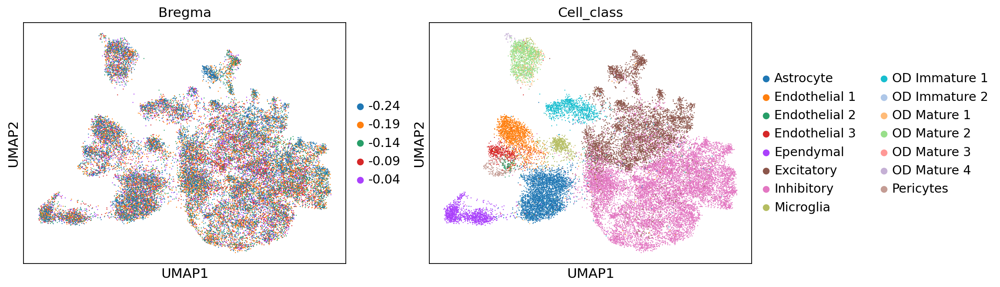

In [11]:
adata = stepc.adata

sc.pp.neighbors(adata, use_rep='X_rep')
sc.tl.umap(adata)
sc.pl.umap(adata, color=['Bregma', 'Cell_class'])

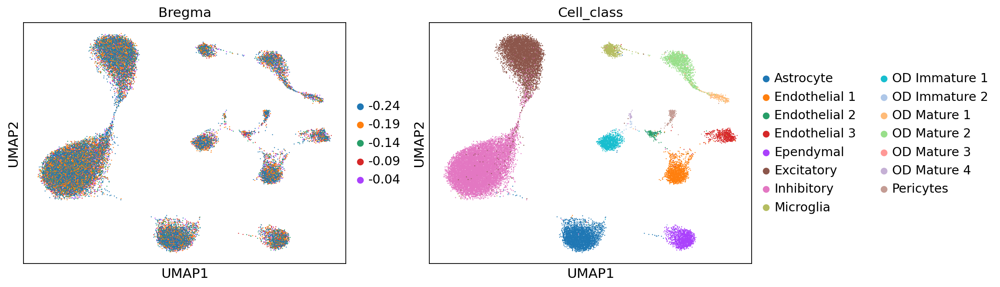

In [12]:
sc.pp.neighbors(adata, use_rep='X_anchord')
sc.tl.umap(adata)
sc.pl.umap(adata, color=['Bregma', 'Cell_class'])

Metrics:   0%|          | 0/10 [00:00<?, ?it/s, Bio conservation: isolated_labels]WARNING:jax._src.xla_bridge:An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.

Metrics:   0%|          | 0/10 [00:00<?, ?it/s]
                                                                                         
Embeddings: 100%|██████████| 2/2 [01:06<00:00, 33.24s/it]atch correction: pcr_comparison]    

                                                                                         

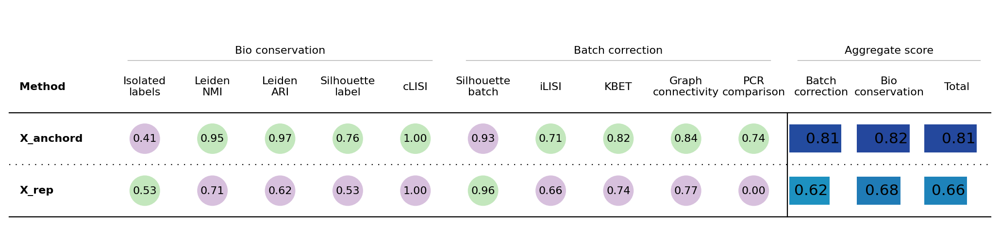

In [15]:
from scib_metrics.benchmark import Benchmarker, BioConservation

biocons = BioConservation(nmi_ari_cluster_labels_leiden=True, nmi_ari_cluster_labels_kmeans=False)
# batcons = BatchCorrection(pcr_comparison=False)
bm = Benchmarker(
    adata,
    batch_key="Bregma",
    label_key="Cell_class",
    embedding_obsm_keys=["X_rep", "X_anchord", "X_pca_corrected", "X_pca"],
    bio_conservation_metrics=biocons,
    # batch_correction_metrics=batcons,
    n_jobs=-1,
)
bm.benchmark()
bm.plot_results_table(min_max_scale=False)

## Spatial domain level heterogeneity by spatially smoothing the embedding in cell state level

In [2]:
model_config = dict(
    n_glayers=4,
    max_neighbors=20,
    variational=True,
)

run_config = dict(
    epochs=400,
    split_rate=0.2,
    n_iterations=800,
    batch_size=1024,
    graph_batch_size=2,
    tune_lr=1e-4,
    beta=1e-4,
    e2e=False,
)

In [3]:
stepc = stModel(
    file_path=st_file,
    n_top_genes=None,
    batch_key='Bregma',
    filtered=True,
    layer_key=None,
    log_transformed=True,
    coord_keys=['Centroid_X', 'Centroid_Y'],
    module_dim=30,
    hidden_dim=64,
    n_modules=20,
    decoder_type='zinb',
    edge_clip=None,
    dispersion='gene',
    use_earlystop=True,
    **model_config,
)

Using all genes
Using given geneset
Adding count data to layer 'counts'
Dataset Done
================Dataset Info================
Batch key: Bregma 
Class key: None 
Number of Batches: 5 
Number of Classes: None 
Gene Expr: (28316, 161)
Batch Label: (28316,)


In [4]:
stepc.run(**run_config)

Training with 2 stages pattern: 1/2
Performing global random split
100%|██████████| 400/400 [03:48<00:00,  1.75epoch/s, kl_loss=0.880, recon_loss=146.231, val_kl_loss=0.884, val_recon_loss=147.476]  
Training graph with multiple batches
Training with 2 stages pattern: 2/2
100%|██████████| 800/800 [07:45<00:00,  1.72epoch/s, kl_loss=0.012, recon_loss=212.722]


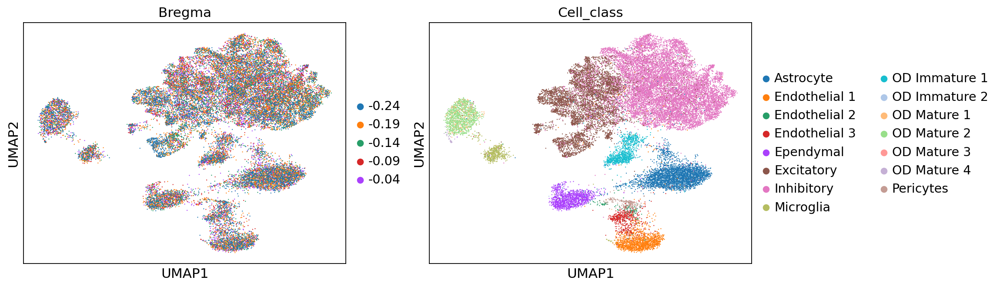

In [5]:
adata = stepc.adata

sc.pp.neighbors(adata, use_rep='X_unsmoothed')
sc.tl.umap(adata)
sc.pl.umap(adata, color=['Bregma', 'Cell_class'])

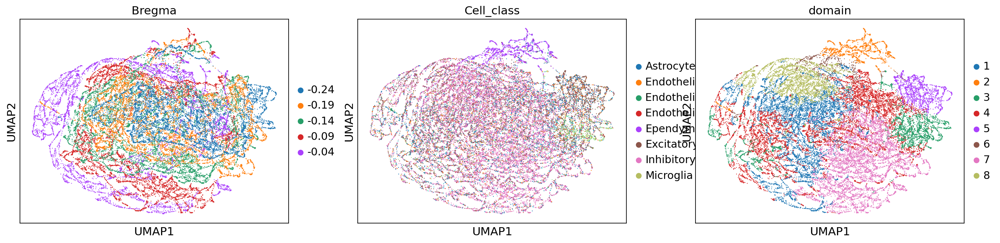

In [6]:
stepc.cluster(adata=adata, use_rep='X_smoothed', n_clusters=8)
sc.pp.neighbors(adata, use_rep='X_smoothed')
sc.tl.umap(adata)
sc.pl.umap(adata, color=['Bregma', 'Cell_class', 'domain'])

Title not provided, or length does not match the number of batches. Using feature names as title.


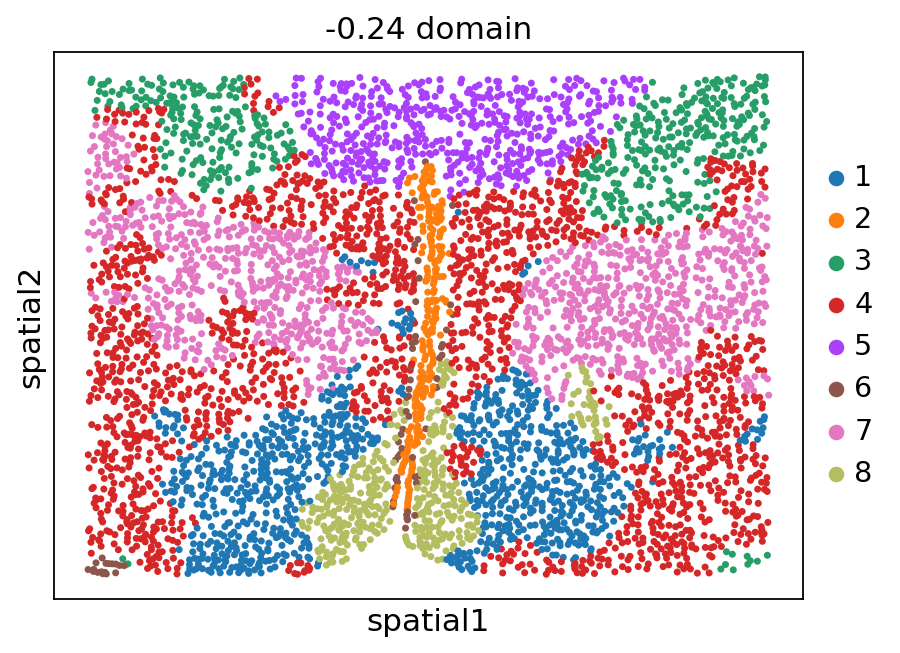

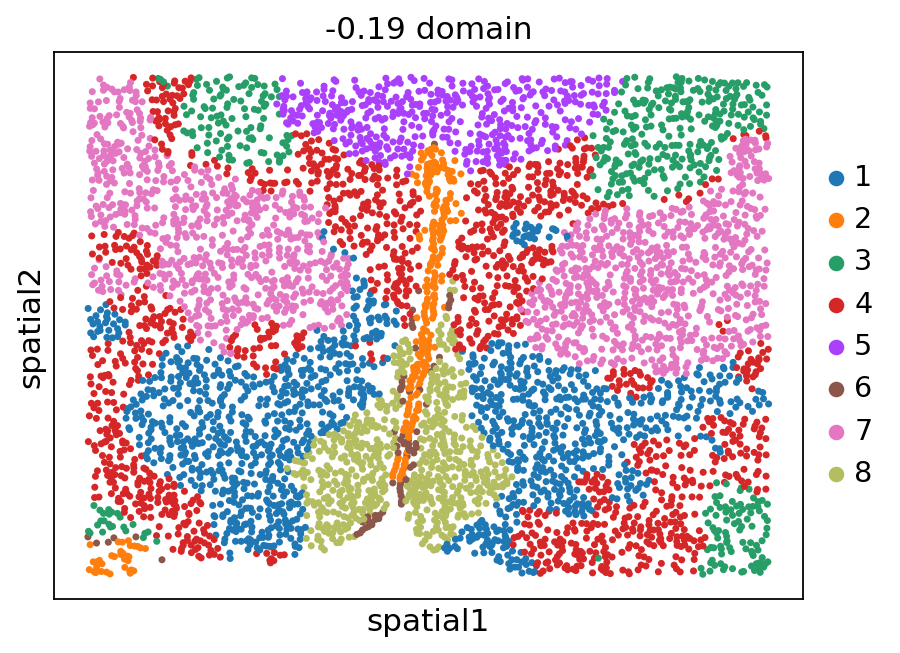

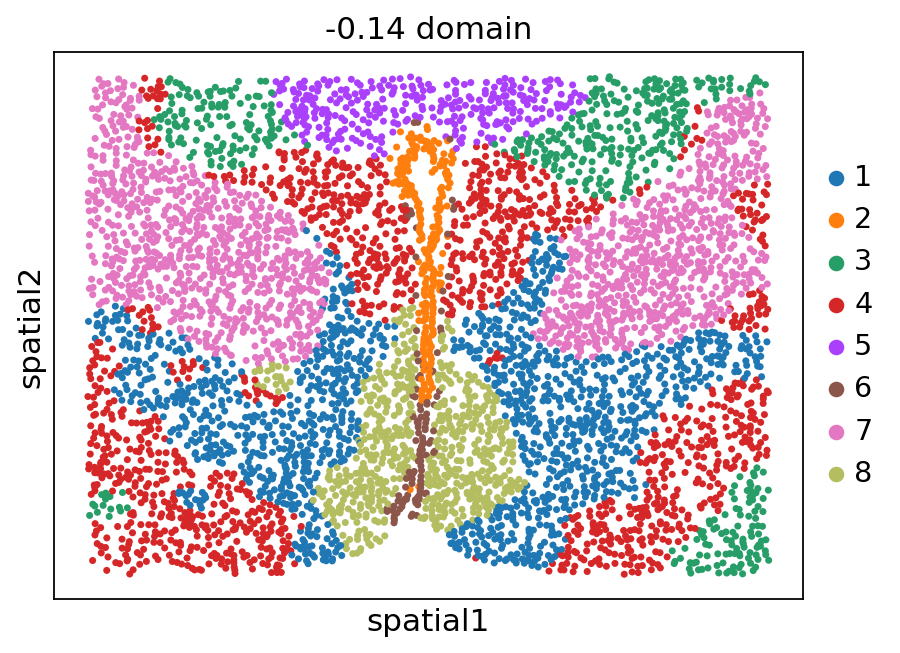

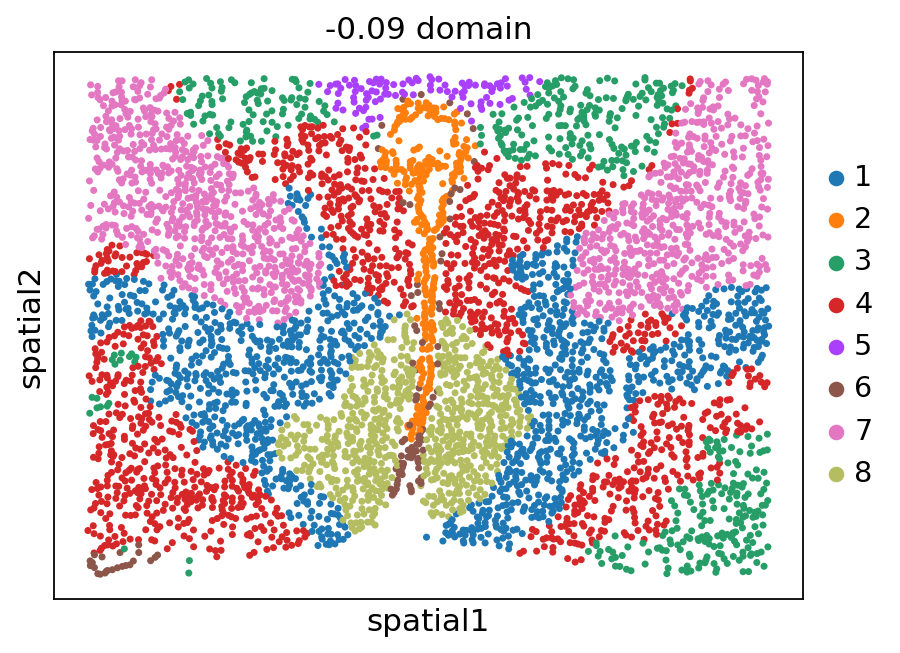

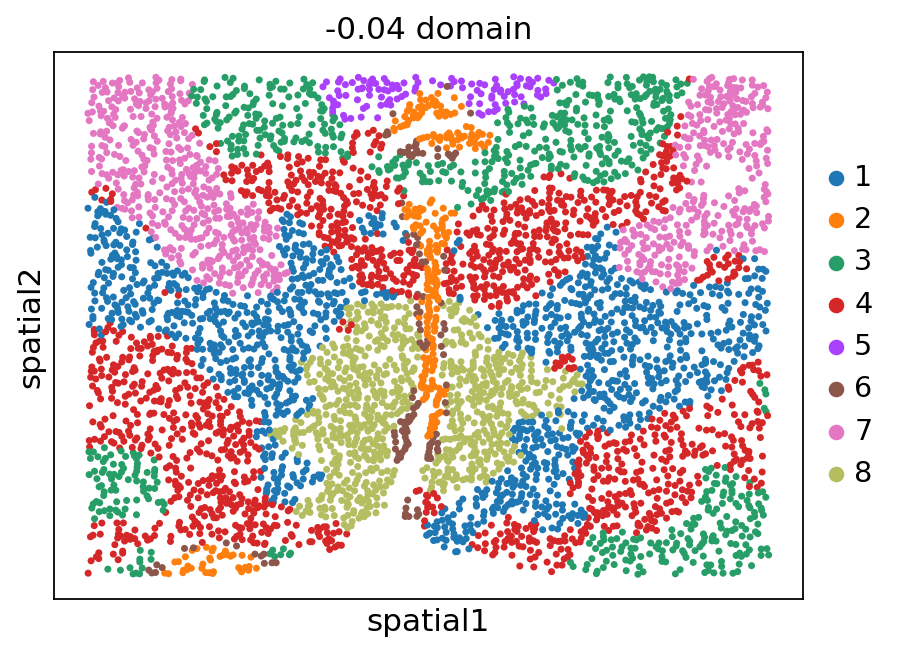

In [12]:
stepc.spatial_plot(color='domain', with_images=False, size=40)

## E2E mode for direct spatial domain identification

### Model config & running config

First, set `e2e=True` to enable the e2e mode. In e2e mode, these parameters used in the non e2e mode will be ignored:
- `epochs`
- `batch_size`
- `split_rate`

Instead, a graph sampling strategy will be used to train the model.

In [2]:
model_config = dict(
    n_glayers=4,
    max_neighbors=30,
    variational=True,
)

run_config = dict(
    n_iterations=2000,
    graph_batch_size=1,
    beta=1e-2,
    e2e=True,
    contrast=True,
)

### Load data and add annotations of zones

<div class="alert alert-info">
    
**Note**: The annotations of zones is obtained from the [tutorial of BASS](https://zhengli09.github.io/BASS-Analysis/MERFISH.html)
    
</div>

In [ ]:
adata = sc.read_h5ad(st_file)

for batch in os.listdir('./data/merfish_anno/'):
    anno = pd.read_csv(f'./data/merfish_anno/{batch}', index_col=0)
    batch_id = batch[:-4][6:]
    adata.obs.loc[adata.obs['Bregma'] == float(batch_id), 'annotation'] = anno['x'].values

### Set up STEP object

In [6]:
stepc = stModel(
    adata=adata,
    n_top_genes=None,
    geneset_to_use=adata.var_names,
    batch_key='Bregma',
    filtered=True,
    layer_key=None,
    log_transformed=True,
    coord_keys=['Centroid_X', 'Centroid_Y'],
    module_dim=30,
    hidden_dim=64,
    n_modules=20,
    decoder_type='zinb',
    edge_clip=None,
    **model_config,
)

Adding count data to layer 'counts'
Dataset Done
Modeling with 1 components
{'variational': True, 'input_dim': 161, 'hidden_dim': 64, 'module_dim': 30, 'decoder_input_dim': None, 'n_modules': 20, 'edge_clip': None, 'decoder_type': 'zinb', 'n_glayers': 4}


### Generate spatially smoothed embeddings and cluster them to obtain spatial domains

In [7]:
stepc.run(**run_config)
adata = stepc.adata

Training with e2e pattern
Training graph with multiple batches


100%|██████████| 2000/2000 [04:22<00:00,  7.60step/s, recon_loss=370.799, kl_loss=0.428, contrast_loss=0.011, val_recon_loss=-, val_kl_loss=-, val_contrast_loss=-]


In [9]:
stepc.cluster(adata, use_rep='X_smoothed', n_clusters=8,)

### Visualization

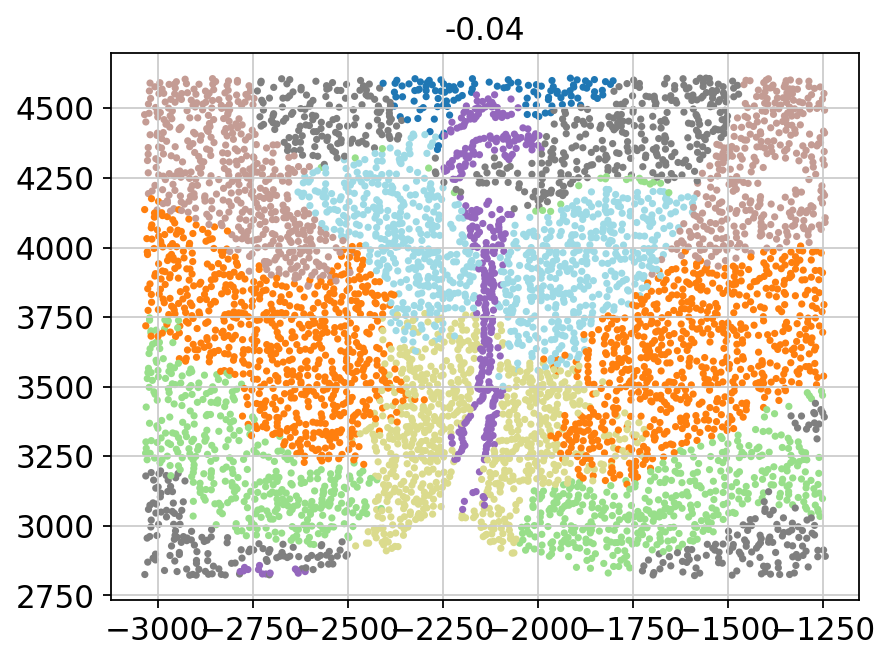

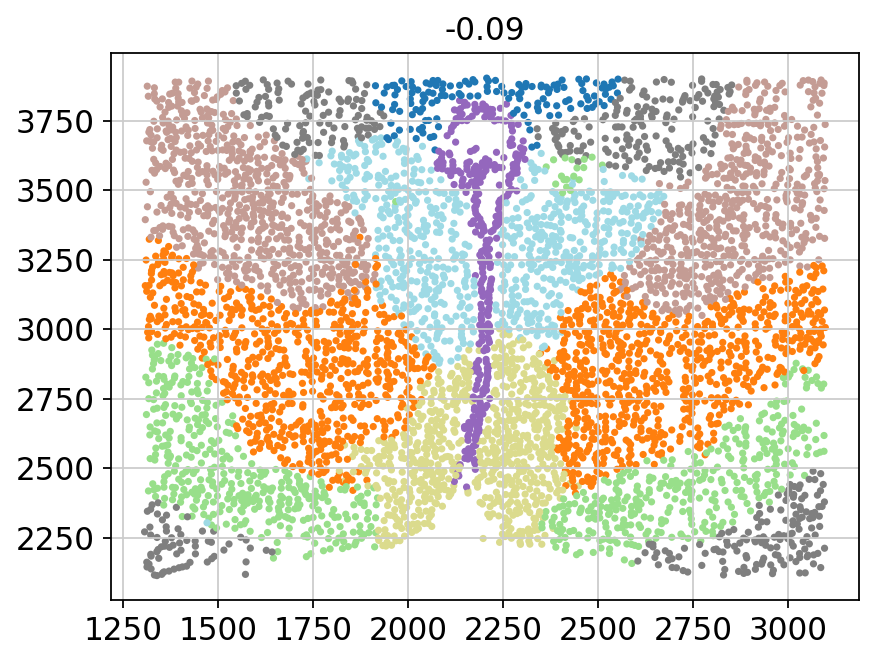

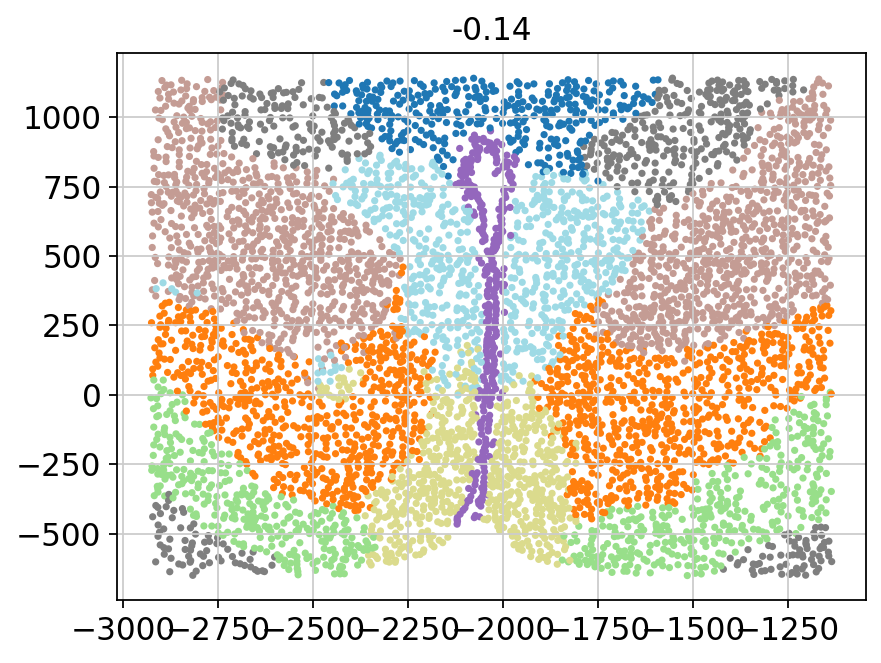

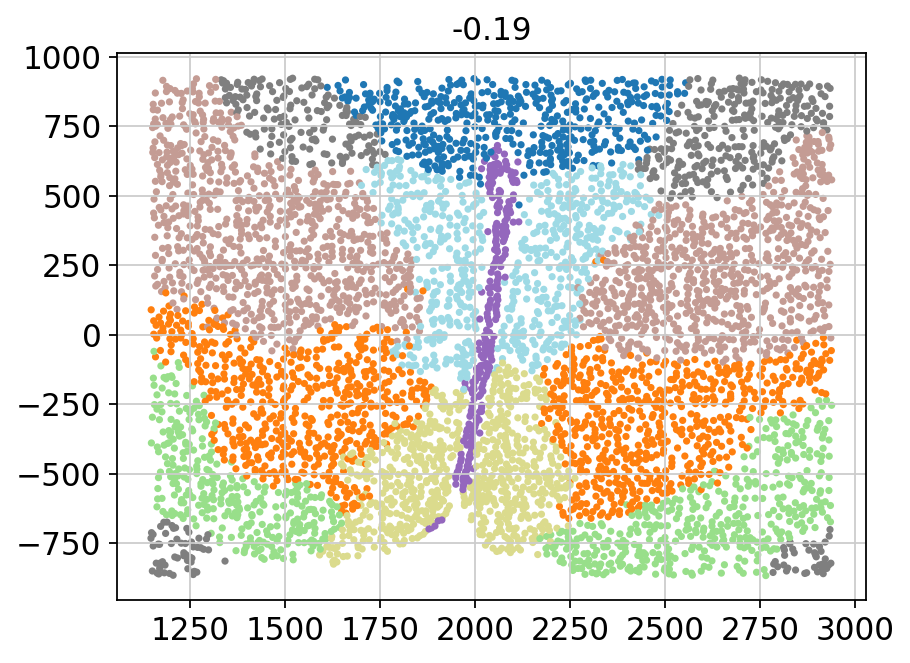

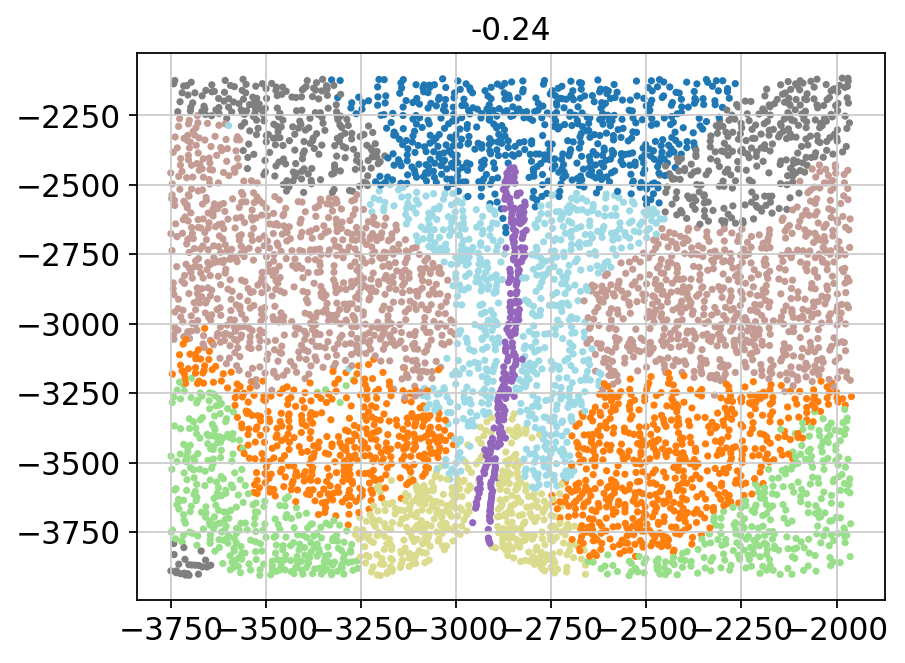

In [10]:
for batch in adata.obs['Bregma'].unique():
    _adata = adata[adata.obs['Bregma'] == batch]
    plt.title(batch)
    plt.scatter(x=_adata.obs['Centroid_X'],
            y=_adata.obs['Centroid_Y'],
            c=_adata.obs['domain'].values.astype(int),
            s=5, cmap='tab20')
    plt.show()

In [11]:
adata.obs['annotation'] = adata.obs['annotation'].astype('category')

### Metrics for evaluation of the obtained spatial domains compared to the annotations

In [13]:
from sklearn.metrics import adjusted_rand_score

for batch in adata.obs['Bregma'].unique():
    _adata = adata[adata.obs['Bregma'] == batch]
    ari = adjusted_rand_score(_adata.obs['domain'].astype(int), _adata.obs['annotation'].cat.codes)
    print(f"{batch}: {ari}")

-0.04: 0.5337230222364567
-0.09: 0.6226701393120998
-0.14: 0.49295132575539485
-0.19: 0.6502377274236062
-0.24: 0.6812873877486072
